/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/
/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_pp/
/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/
{'proj4': '+proj=longlat +datum=WGS84 +no_defs', 'minx': -106.45041666666549, 'miny': 35.049583333332606, 'maxx': -104.94958333333221, 'maxy': 36.55041666666588, 'resx': 0.0008333333333333, 'resy': -0.0008333333333333, 'gt': (-106.45041666666549, 0.0008333333333333, 0.0, 36.55041666666588, 0.0, -0.0008333333333333), 'nx': 1801, 'ny': 1801, 'projection': 'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'}
Group Keys: dict_keys(['meteorology'

/projects/battobrah@xsede.org/code-server/tmp/ipykernel_2275929/3967048617.py:130: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='terrain')


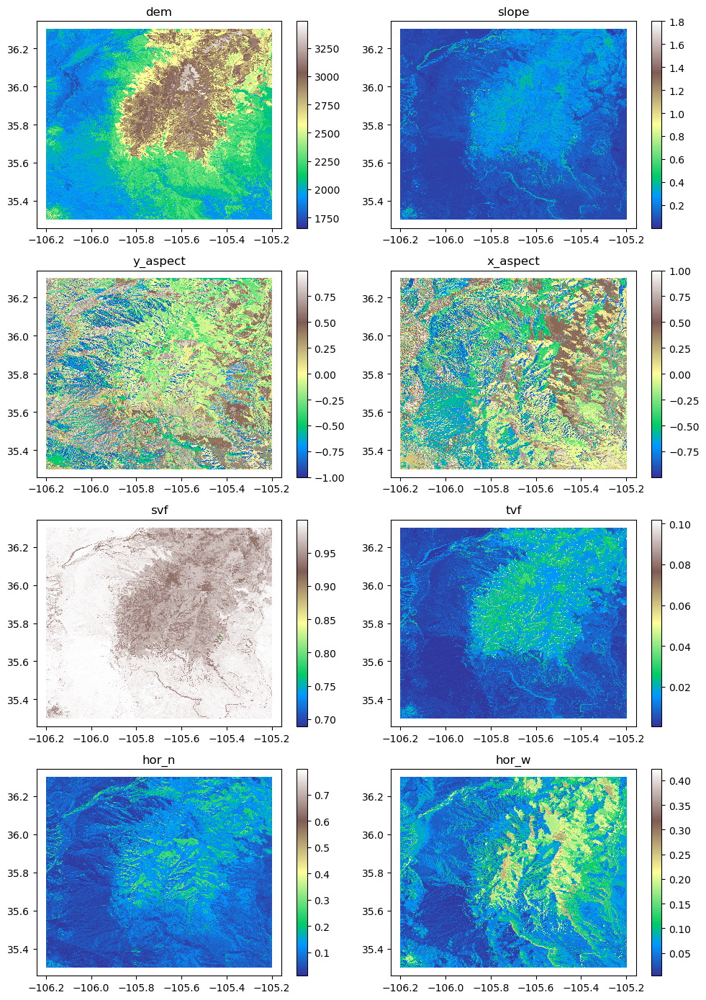

In [5]:
import numpy as np
import netCDF4 as nc
import numba
import pandas as pd
import geospatialtools.gdal_tools as gdal_tools
import gdal_tools
import sys
import matplotlib.pyplot as plt
import rasterio
import os 
import matplotlib.colors as colors


# Output path setup
#outputdir = "/projects/ezorzetto@xsede.org/HydroBlocks/output_plots"
outputdir = "/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/output_plots"
os.system("mkdir -p {}".format(outputdir))

# Path setup
# path_3d2 = '/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project2_3d2/'

#path_3d = '/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project3_3d/'
#path_pp = '/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project3_pp/'

path_3d = '/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/'
path_pp = '/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_pp/'

print(path_3d)
print(path_pp)

# hrus should be the same between the two model configurations
#hrus = gdal_tools.read_raster('/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project3_3d/postprocess/hrus.vrt')
#metad = gdal_tools.retrieve_metadata('/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project3_3d/postprocess/hrus.vrt')

hrus = gdal_tools.read_raster('/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/postprocess/hrus.vrt')
metad = gdal_tools.retrieve_metadata('/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/postprocess/hrus.vrt')


# Path setup
path = path_3d
print(path)

# map buffer
buffer = 250

# get raster coordinate axis
print(metad)
coord_xx0 = np.linspace(metad['minx'], metad['maxx'], metad['nx'])
coord_yy0 = np.linspace(metad['miny'], metad['maxy'], metad['ny'])
coords_x = coord_xx0[buffer:np.size(coord_xx0)-buffer+1]
coords_y = coord_yy0[buffer:np.size(coord_yy0)-buffer+1]

# GET TIME AXIS FROM FORCING DATA, COVERT TO LOCAL TIME
for c in range(1, 2):
    fp = nc.Dataset(path + '%s/input_file.nc' % c)
    group_keys = fp.groups.keys()
    print("Group Keys:", group_keys)
    time = fp.groups['meteorology']['time'][:]
    print("Group Keys:", group_keys)
    for group_name in group_keys:
        print(f"\nContents of group: '{group_name}'")
        group = fp.groups[group_name]
    print("  Variables:", group.variables.keys())
    print("  Subgroups:", group.groups.keys())
# get time axis
start_date = '20116-01-01'
start = pd.Timestamp("2016-01-01 00:00")
datetime_series = start + pd.to_timedelta(time, unit="h")
datetime_series = datetime_series.tz_localize("UTC")
# times = pd.Series(datetime_series, name="datetime")
datetime_series = datetime_series.tz_convert("America/Denver")
times = pd.Series(datetime_series, name="datetime")

# @numba.jit()
def place_data(tmp, model, hrus, cids, val):
    for i in range(tmp.shape[0]):
        for j in range(tmp.shape[1]):
            hru = int(hrus[i,j])
            ucid = int(cids[i,j])
            if (hru != -9999) & (ucid == val):
                tmp[i,j] = model[hru]
    return tmp



# var2plot = ["dem","slope",  "y_aspect", "x_aspect","svf","tvf", "hand", "hru"]
var2plot = ["dem","slope",  "y_aspect", "x_aspect","svf","tvf", "hor_n", "hor_w"]

# hrus = gdal_tools.read_raster('/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus.vrt')

cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
tmp = np.copy(hrus)
tmp[:] = -9999.0

# Create a 6x2 grid of subplots
fig, axes = plt.subplots(4, 2, figsize=(10, 14))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Loop over the variables in var2plot and plot each in a subplot
for j, ax in enumerate(axes):
    var = var2plot[j]
    if j >= len(var2plot):
        # If there are more subplots than variables, hide the extra axes
        ax.axis('off')
        continue


    for c in range(1, 2):
        fp = nc.Dataset(path + '%s/input_file.nc' % c)
        if var in ["lwdown","swdown"]:
            grp = fp.groups['meteorology']
        else:
            grp = fp.groups['parameters']
        
        data = np.array(grp.variables[var2plot[j]][:])
        final_map = place_data(tmp, data, hrus, cids, int(c))
    
    # Mask out invalid values
    final_map = np.ma.masked_array(final_map, final_map == -9999)
    final_map[final_map==-9999] = np.nan
    # remove buffer from plots:
    map_shape = final_map.shape
    
    final_map = final_map[buffer:map_shape[0]-buffer+1, buffer:map_shape[1]-buffer+1]
    # if var2plot[j]=='dem': dem_map = final_map
    # Plot in the corresponding subplot
    # hru_path = "/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus/1.tif"
    # hru = rasterio.open(hru_path)
    # im = ax.imshow(final_map, cmap='terrain')
    im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='terrain')
    ax.set_title(var2plot[j])  # Set the title for each subplot
    fig.colorbar(im, ax=ax)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.savefig(os.path.join(outputdir, 'res_terrain.png'), dpi = 300)
plt.show()


/projects/battobrah@xsede.org/code-server/tmp/ipykernel_2275929/2898109728.py:45: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='viridis')


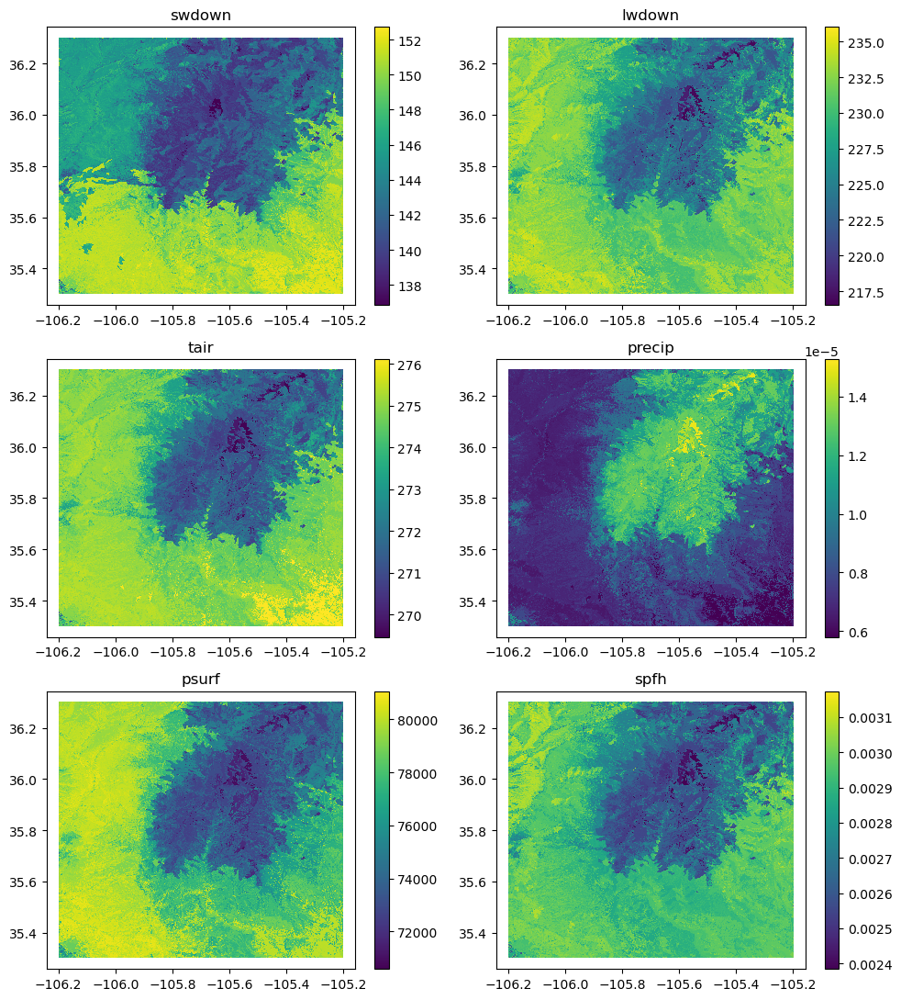

In [6]:
# PLOT METEOROLOGICAL FORCING - SEASONAL AVERAGE

var2plot = ["swdown","lwdown", "tair", "precip", "psurf","spfh"]

hrus = gdal_tools.read_raster('/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/postprocess/hrus.vrt')

cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
tmp = np.copy(hrus)
tmp[:] = -9999.0

# Create a 6x2 grid of subplots
fig, axes = plt.subplots(3, 2, figsize=(10, 11))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Loop over the variables in var2plot and plot each in a subplot
for j, ax in enumerate(axes):
    var = var2plot[j]
    if j >= len(var2plot):
        # If there are more subplots than variables, hide the extra axes
        ax.axis('off')
        continue


    for c in range(1, 2):
        fp = nc.Dataset(path + '%s/input_file.nc' % c)
        grp = fp.groups['meteorology']

        data = np.array(grp.variables[var2plot[j]][:])
        times_index = ((times.dt.month == 12)|(times.dt.month == 1)|(times.dt.month == 2)) # WINTER
        data_sel = data[times_index,:]
        data_ave = np.mean(data_sel, axis=0)
        final_map = place_data(tmp, data_ave, hrus, cids, int(c))
    
    # Mask out invalid values
    final_map = np.ma.masked_array(final_map, final_map == -9999)
    final_map[final_map==-9999] = np.nan
    # remove buffer from plots:
    map_shape = final_map.shape
    
    final_map = final_map[buffer:map_shape[0]-buffer+1, buffer:map_shape[1]-buffer+1]
    # Plot in the corresponding subplot
    # hru_path = "/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus/1.tif"
    # hru = rasterio.open(hru_path)
    # im = ax.imshow(final_map, cmap='viridis')
    im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='viridis')
    ax.set_title(var2plot[j])  # Set the title for each subplot
    fig.colorbar(im, ax=ax)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.savefig(os.path.join(outputdir, 'res_forcing_winter.png'), dpi = 300)
plt.show()

/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/
Creating differences plot for Winter


/projects/battobrah@xsede.org/code-server/tmp/ipykernel_2275929/604443866.py:47: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='viridis')


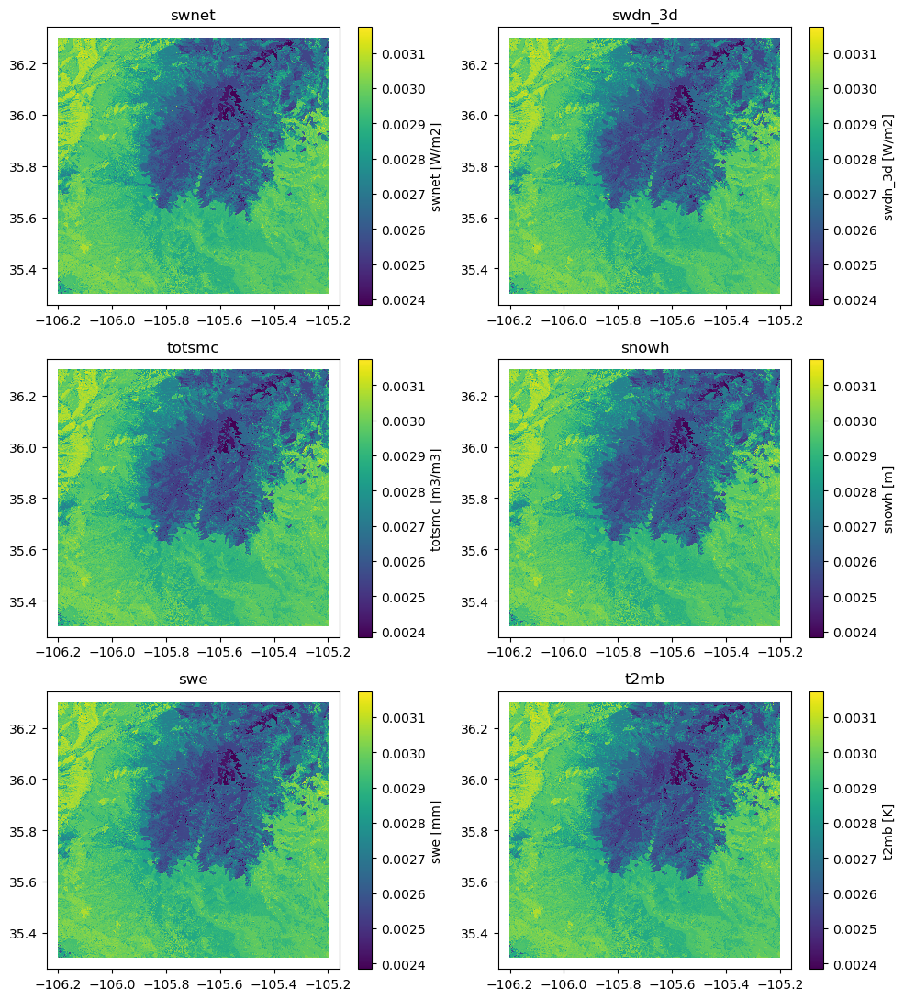

Creating differences plot for Spring


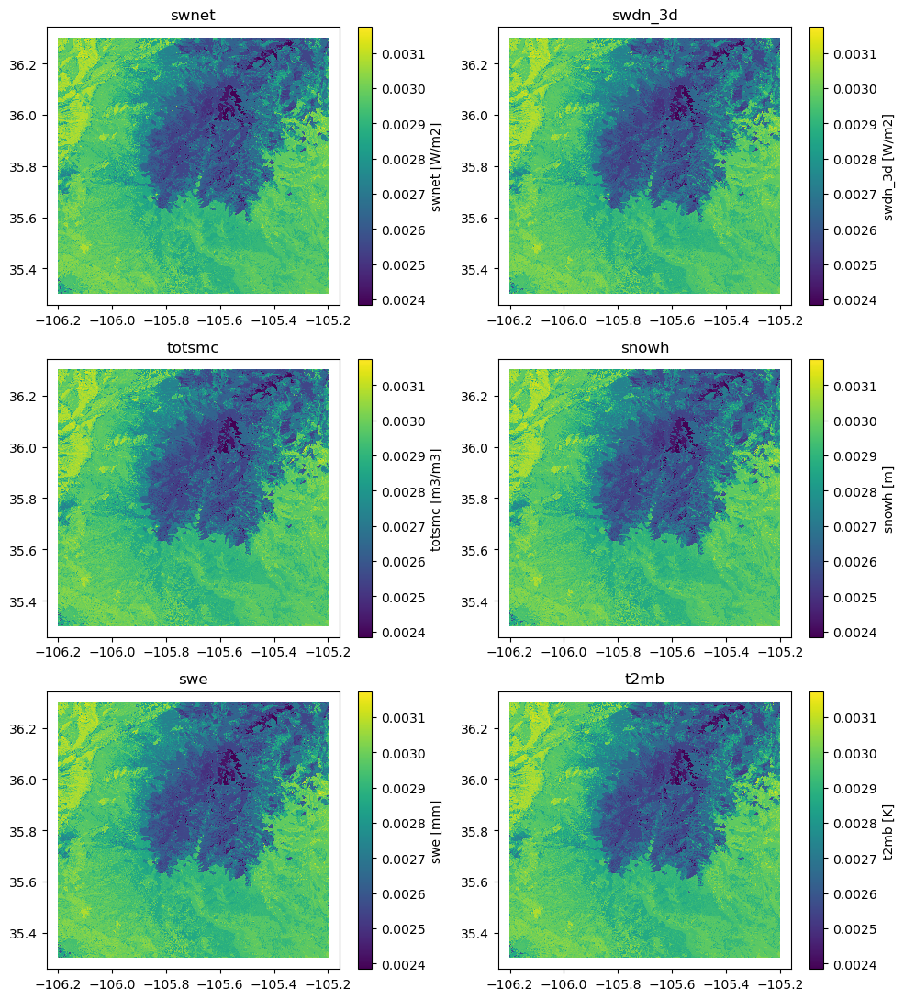

Creating differences plot for Summer


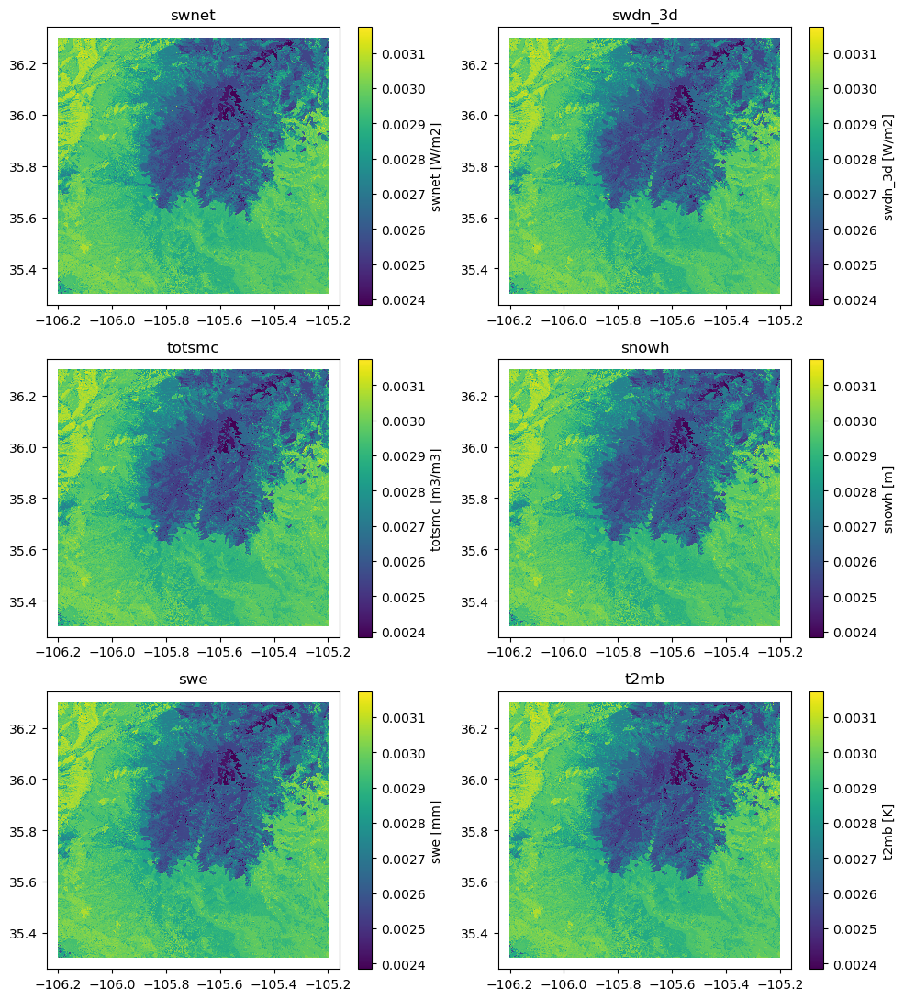

Creating differences plot for Fall


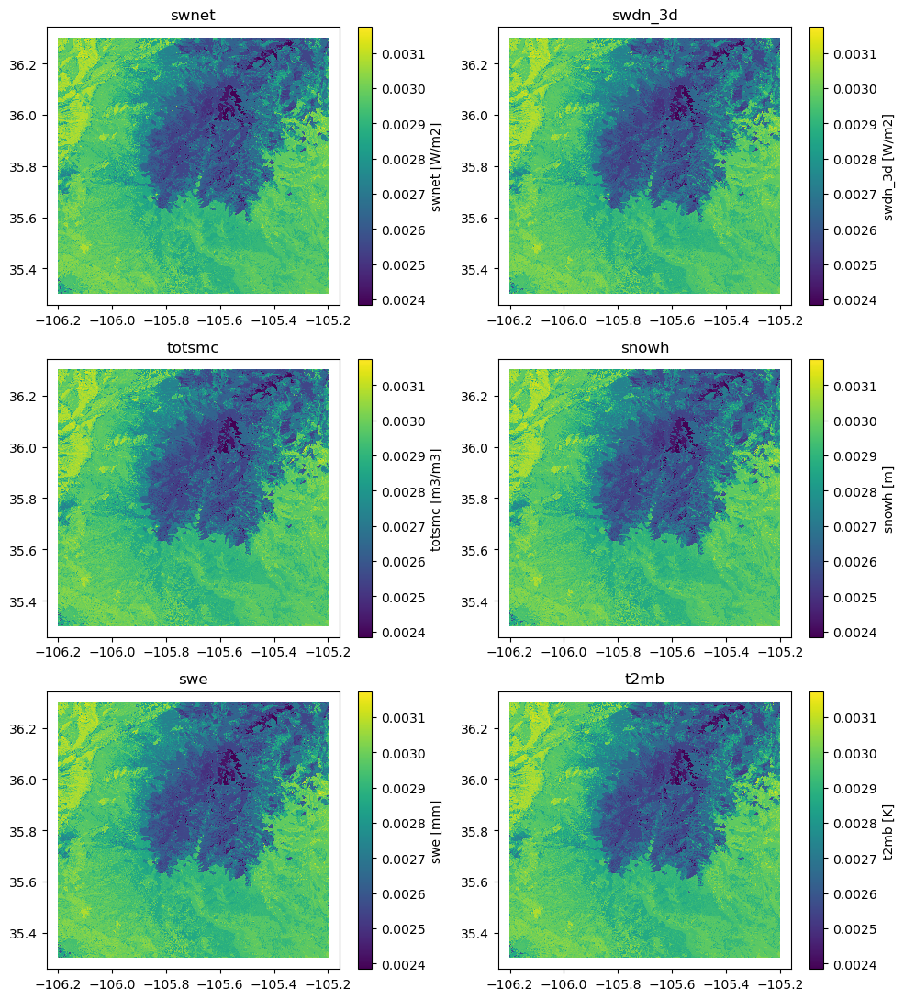

In [3]:

# PLOT MODEL OUTPUT VARIABLES FOR RAD 3D MODEL
path = path_3d
print(path)

seasons = ['Winter', 'Spring', 'Summer', 'Fall']
season_months = [(12,1,2), (3, 4, 5), (6, 7, 8), (9, 10, 11)]

var2plot = ["swnet", "swdn_3d", "totsmc", "snowh", "swe", "t2mb"]
var2units= ["W/m2", "W/m2", "m3/m3", "m", "mm", "K"]

# hrus = gdal_tools.read_raster('/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus.vrt')

cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
tmp = np.copy(hrus)
tmp[:] = -9999.0

for iss, my_season in enumerate(seasons):
    my_months = season_months[iss]
    print("Creating differences plot for {}".format(my_season))
    # Create a 6x2 grid of subplots
    fig, axes = plt.subplots(3, 2, figsize=(10, 11))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
    # Loop over the variables in var2plot and plot each in a subplot
    for j, ax in enumerate(axes):
        var = var2plot[j]
        if j >= len(var2plot):
            # If there are more subplots than variables, hide the extra axes
            ax.axis('off')
            continue
        for c in range(1, 2):
            fp = nc.Dataset(path + '/output_data/{}/2016-01-01.nc'.format(c))
            grp = fp.groups['data']
            data = np.array(grp.variables[var2plot[j]][:])
            #times_index = ((times.dt.month == my_months[0])|(times.dt.month == my_months[1])|(times.dt.month == my_months[2])) # select season from entire dataset
            #data_sel = data[times_index,:]
            #data_ave = np.mean(data_sel, axis=0)
            final_map = place_data(tmp, data_ave, hrus, cids, int(c))
        # Mask out invalid values
        final_map = np.ma.masked_array(final_map, final_map == -9999)
        final_map[final_map==-9999] = np.nan
        
        final_map = final_map[buffer:map_shape[0]-buffer+1, buffer:map_shape[1]-buffer+1]
        # Plot in the corresponding subplot
        # hru_path = "/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus/1.tif"
        # hru = rasterio.open(hru_path)
        # im = ax.imshow(final_map, cmap='viridis')
        im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='viridis')
        ax.set_title(var2plot[j])  # Set the title for each subplot
        fig.colorbar(im, ax=ax, label = '{} [{}]'.format(var2plot[j], var2units[j]))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.savefig(os.path.join(outputdir, 'res_values_{}.png'.format(my_season)), dpi = 300)
    plt.show()




#


In [4]:
varname = var2plot[j]
v = grp.variables[varname]

print("var:", varname)
print("data shape:", v.shape)
print("dims:", v.dimensions)
print("len(times):", len(times))
print("times_index len:", len(times_index))


var: t2mb
data shape: (8744, 1000)
dims: ('time', 'hru')
len(times): 8744
times_index len: 8744


Creating differences plot for Winter


/projects/battobrah@xsede.org/code-server/tmp/ipykernel_913439/4294588808.py:78: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='bwr', norm=diff_norm)


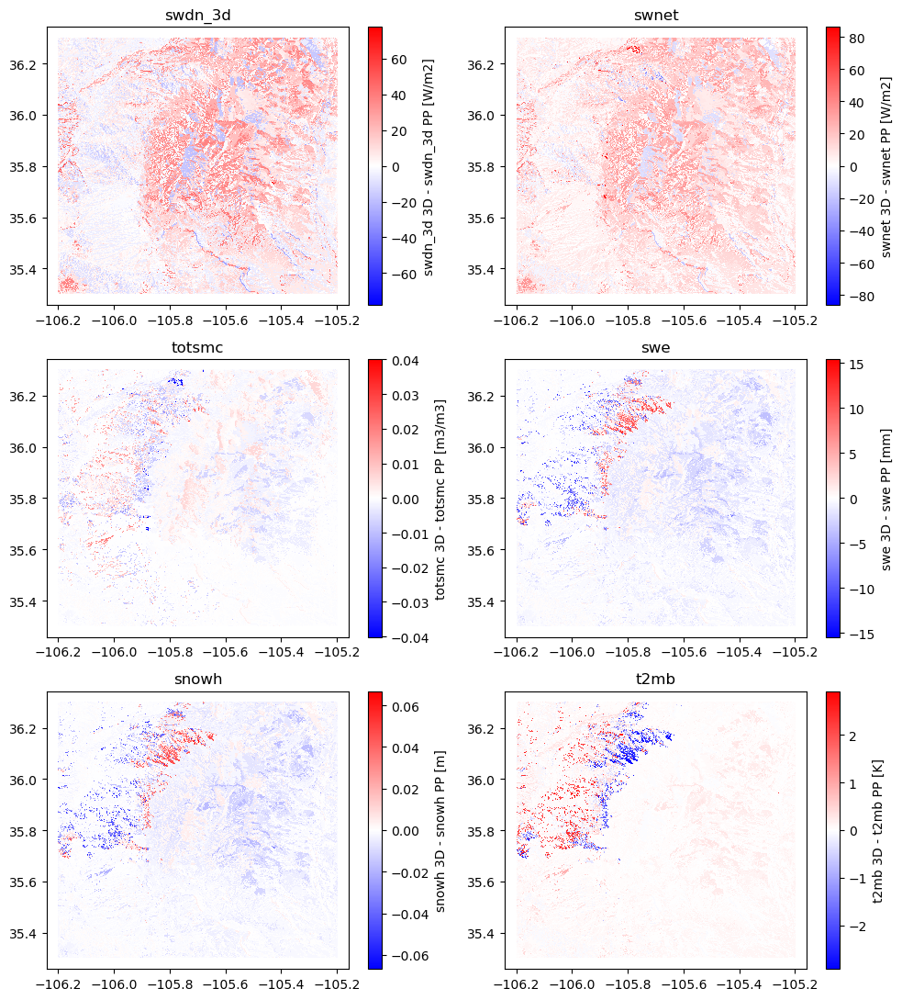

Creating differences plot for Spring


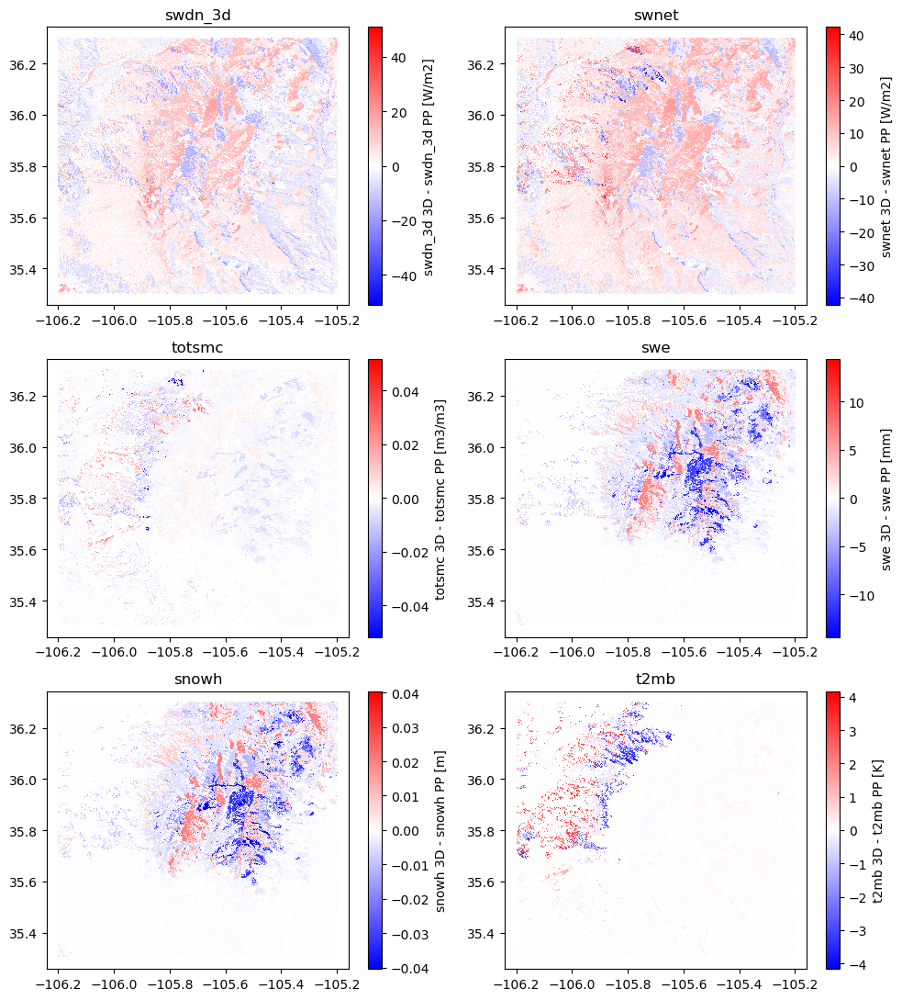

Creating differences plot for Summer


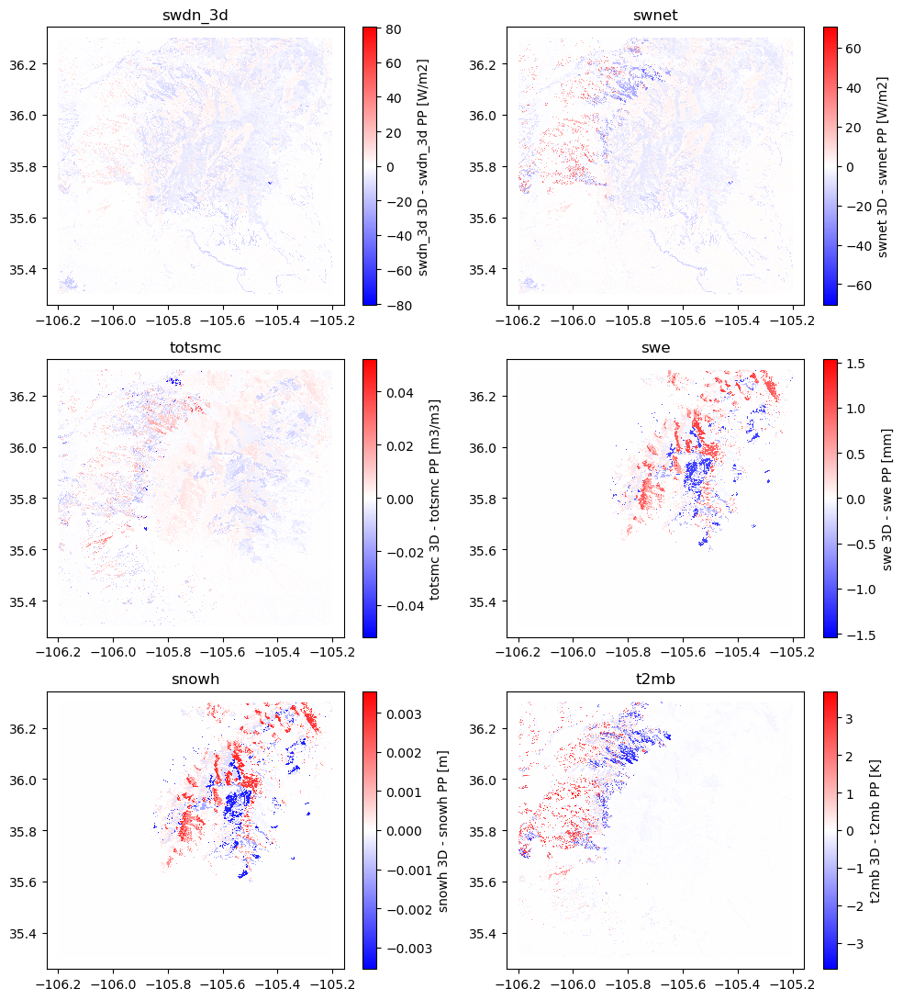

Creating differences plot for Fall


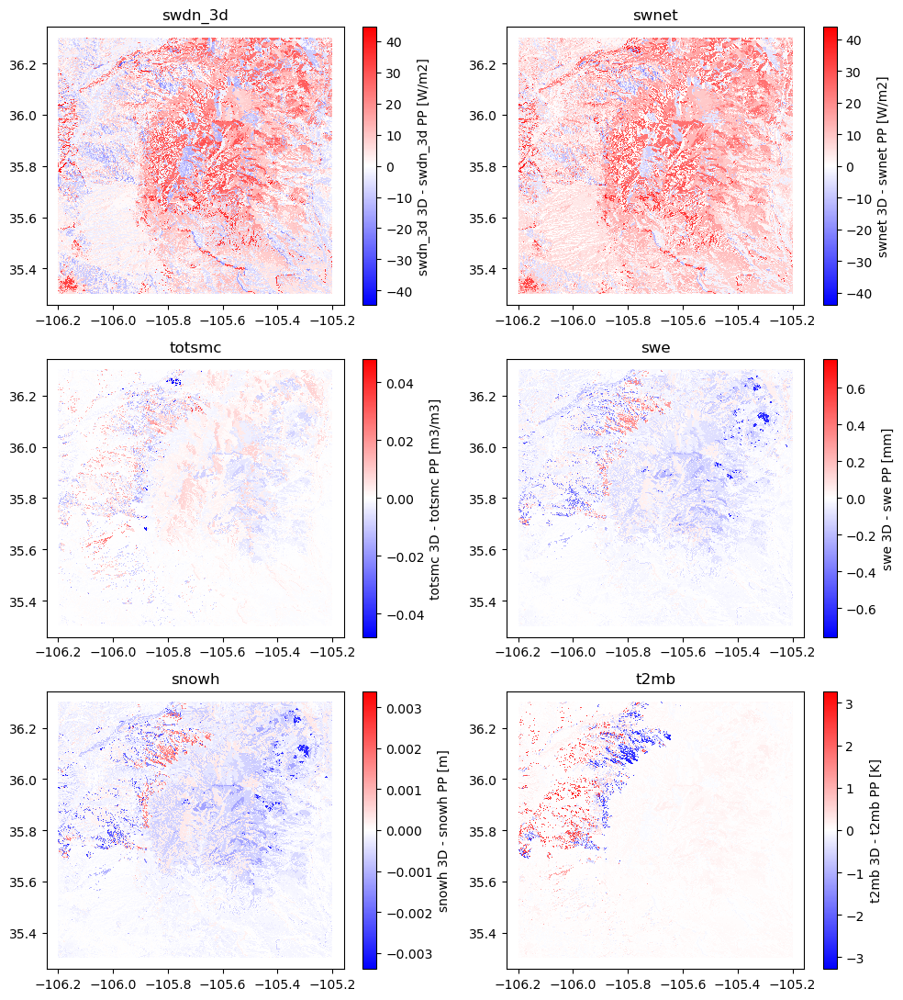

In [5]:

# plot the differeneces of these variables between the two simulations
var2plot = ["swdn_3d", "swnet", "totsmc", "swe", "snowh", "t2mb"]
unit2plot= ['W/m2', 'W/m2', 'm3/m3', 'mm', 'm', 'K']

seasons = ['Winter', 'Spring', 'Summer', 'Fall']
season_months = [(12,1,2), (3, 4, 5), (6, 7, 8), (9, 10, 11)]
# hrus should be the same between the two model configurations
# hrus = gdal_tools.read_raster('/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus.vrt')

cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
tmp = np.copy(hrus)
tmp[:] = -9999.0

for iss, my_season in enumerate(seasons):
    my_months = season_months[iss]
    print("Creating differences plot for {}".format(my_season))
    

    # Create a 4x2 grid of subplots
    fig, axes = plt.subplots(3, 2, figsize=(10, 11))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

    # Loop over the variables in var2plot and plot each in a subplot
    for j, ax in enumerate(axes):
        var = var2plot[j]
        if j >= len(var2plot):
            # If there are more subplots than variables, hide the extra axes
            ax.axis('off')
            continue


        for c in range(1, 2):
            fp_3d = nc.Dataset(path_3d + '/output_data/{}/2016-01-01.nc'.format(c))
            grp_3d = fp_3d.groups['data']
            data_3d = np.array(grp_3d.variables[var2plot[j]][:])

            fp_pp = nc.Dataset(path_pp + '/output_data/{}/2016-01-01.nc'.format(c))
            grp_pp = fp_pp.groups['data']
            if var2plot[j] in ['swdn_3d', 'lwdn_3d']:
                var2plot_temp = var2plot[j].split('_')[0]
                data_pp = np.array(grp_pp.variables[var2plot_temp][:])
            else:
                data_pp = np.array(grp_pp.variables[var2plot[j]][:])
        

            # compute difference between 3D and PP simulations
            data_diff = data_3d - data_pp
        
        
            # subset or average data in time
            times_index = ((times.dt.month == my_months[0])|(times.dt.month == my_months[1])|(times.dt.month == my_months[2])) # select season from entire dataset

            # times_index = (times.dt.month == 2)

            data_diff_sel = data_diff[times_index,:]
            data_diff_ave = np.mean(data_diff_sel, axis=0)

            final_map = place_data(tmp, data_diff_ave, hrus, cids, int(c))
    
        # Mask out invalid values
        final_map = np.ma.masked_array(final_map, final_map == -9999)
        final_map[final_map==-9999] = np.nan
        
        final_map = final_map[buffer:map_shape[0]-buffer+1, buffer:map_shape[1]-buffer+1]
        # Plot in the corresponding subplot
        # hru_path = "/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus/1.tif"
        # hru = rasterio.open(hru_path)
        # im = ax.imshow(final_map, cmap='terrain')

        mymin = np.abs(np.nanmin(final_map))
        mymax = np.abs(np.nanmax(final_map))
        diff_norm = colors.TwoSlopeNorm(
            vmin=-max(mymin, mymax),
            vcenter=0.0,
            vmax= max(mymin, mymax)
            )
        # im = ax.imshow(final_map, cmap='bwr', norm=diff_norm)
        im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='bwr', norm=diff_norm)
        ax.set_title(var2plot[j])  # Set the title for each subplot
        fig.colorbar(im, ax=ax, label = '{} 3D - {} PP [{}]'.format(var2plot[j], var2plot[j],unit2plot[j]))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.savefig(os.path.join(outputdir, 'res_difference_{}.png'.format(my_season)), dpi = 300)
    plt.show()

In [6]:
path_pp

'/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_pp/'

In [7]:
# do scatter plot between terrain variables and seasonal average difference between model configs
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
season_months = [(12,1,2), (3, 4, 5), (6, 7, 8), (9, 10, 11)]

my_var2plot = 'swdn_3d'

X_ASP_DATA = []
Y_ASP_DATA = []
SWDN_DIFF_DATA = []


for iss, my_season in enumerate(seasons):
    my_months = season_months[iss]
    print(my_season, my_months)



    for c in range(1, 2):
        fp = nc.Dataset(path + '%s/input_file.nc' % c)
        grp = fp.groups['parameters']
        x_asp = np.array(grp.variables['x_aspect'][:])
        y_asp = np.array(grp.variables['y_aspect'][:])



    for c in range(1, 2):
        fp_3d = nc.Dataset(path_3d + '/output_data/{}/2016-01-01.nc'.format(c))
        grp_3d = fp_3d.groups['data']
        data_3d = np.array(grp_3d.variables[my_var2plot][:])
        fp_pp = nc.Dataset(path_pp + '/output_data/{}/2016-01-01.nc'.format(c))
        grp_pp = fp_pp.groups['data']
        data_pp = np.array(grp_pp.variables[my_var2plot][:])
        data_diff = data_3d - data_pp        
        # subset or average data in time
        times_index = ((times.dt.month == my_months[0])|(times.dt.month == my_months[1])|(times.dt.month == my_months[2])) # select season from entire dataset
        data_diff_sel = data_diff[times_index,:]
        data_diff_ave = np.mean(data_diff_sel, axis=0)

    X_ASP_DATA.append(x_asp)
    Y_ASP_DATA.append(y_asp)
    SWDN_DIFF_DATA.append(data_diff_ave)



fig, axes = plt.subplots(2, 2, figsize = (8,8))
axes[0,0].plot(X_ASP_DATA[0], SWDN_DIFF_DATA[0], 'o')
axes[0,0].plot(X_ASP_DATA[0], SWDN_DIFF_DATA[0]*0, '--k')
axes[0,0].set_xlabel('X ASPECT')
axes[0,0].set_ylabel('SWDN 3D - SWDN PP')
axes[0,0].set_title(seasons[0])

axes[1,0].plot(X_ASP_DATA[1], SWDN_DIFF_DATA[1], 'o')
axes[1,0].plot(X_ASP_DATA[1], SWDN_DIFF_DATA[1]*0, '--k')
axes[1,0].set_xlabel('X ASPECT')
axes[1,0].set_ylabel('SWDN 3D - SWDN PP')
axes[1,0].set_title(seasons[1])

axes[0,1].plot(X_ASP_DATA[2], SWDN_DIFF_DATA[2], 'o')
axes[0,1].plot(X_ASP_DATA[2], SWDN_DIFF_DATA[2]*0, '--k')
axes[0,1].set_xlabel('X ASPECT')
axes[0,1].set_ylabel('SWDN 3D - SWDN PP')
axes[0,1].set_title(seasons[2])

axes[1,1].plot(X_ASP_DATA[3], SWDN_DIFF_DATA[3], 'o')
axes[1,1].plot(X_ASP_DATA[3], SWDN_DIFF_DATA[3]*0, '--k')
axes[1,1].set_xlabel('X ASPECT')
axes[1,1].set_ylabel('SWDN 3D - SWDN PP')
axes[1,1].set_title(seasons[3])

plt.tight_layout()
plt.savefig(os.path.join(outputdir, 'scatter_x_aspect.png'), dpi = 300)
plt.show()


fig, axes = plt.subplots(2, 2, figsize = (8,8))
axes[0,0].plot(Y_ASP_DATA[0], SWDN_DIFF_DATA[0], 'o')
axes[0,0].plot(Y_ASP_DATA[0], SWDN_DIFF_DATA[0]*0, '--k')
axes[0,0].set_xlabel('Y ASPECT')
axes[0,0].set_ylabel('SWDN 3D - SWDN PP')
axes[0,0].set_title(seasons[0])

axes[1,0].plot(Y_ASP_DATA[1], SWDN_DIFF_DATA[1], 'o')
axes[1,0].plot(Y_ASP_DATA[1], SWDN_DIFF_DATA[1]*0, '--k')
axes[1,0].set_xlabel('Y ASPECT')
axes[1,0].set_ylabel('SWDN 3D - SWDN PP')
axes[1,0].set_title(seasons[1])

axes[0,1].plot(Y_ASP_DATA[2], SWDN_DIFF_DATA[2], 'o')
axes[0,1].plot(Y_ASP_DATA[2], SWDN_DIFF_DATA[2]*0, '--k')
axes[0,1].set_xlabel('Y ASPECT')
axes[0,1].set_ylabel('SWDN 3D - SWDN PP')
axes[0,1].set_title(seasons[2])

axes[1,1].plot(Y_ASP_DATA[3], SWDN_DIFF_DATA[3], 'o')
axes[1,1].plot(Y_ASP_DATA[3], SWDN_DIFF_DATA[3]*0, '--k')
axes[1,1].set_xlabel('Y ASPECT')
axes[1,1].set_ylabel('SWDN 3D - SWDN PP')
axes[1,1].set_title(seasons[3])

plt.tight_layout()
plt.savefig(os.path.join(outputdir, 'scatter_y_aspect.png'), dpi = 300)
plt.show()

Winter (12, 1, 2)


KeyError: 'swdn_3d'

Creating differences plot for Winter


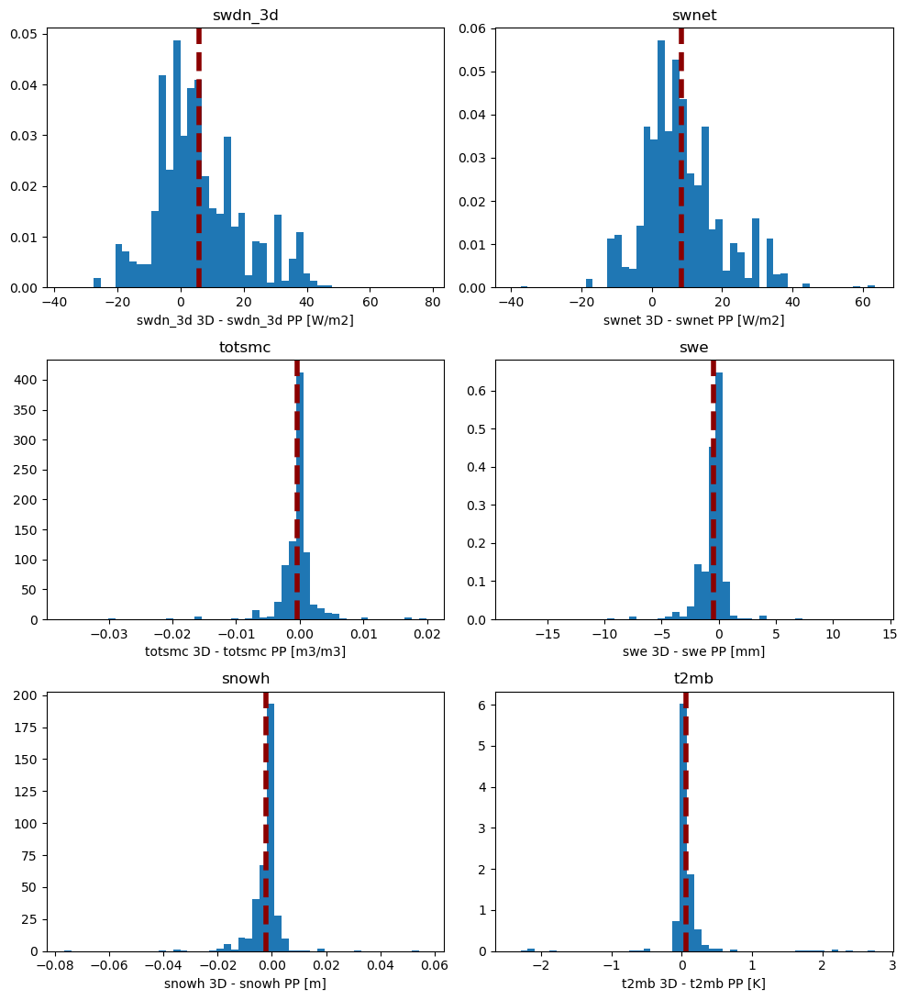

Creating differences plot for Spring


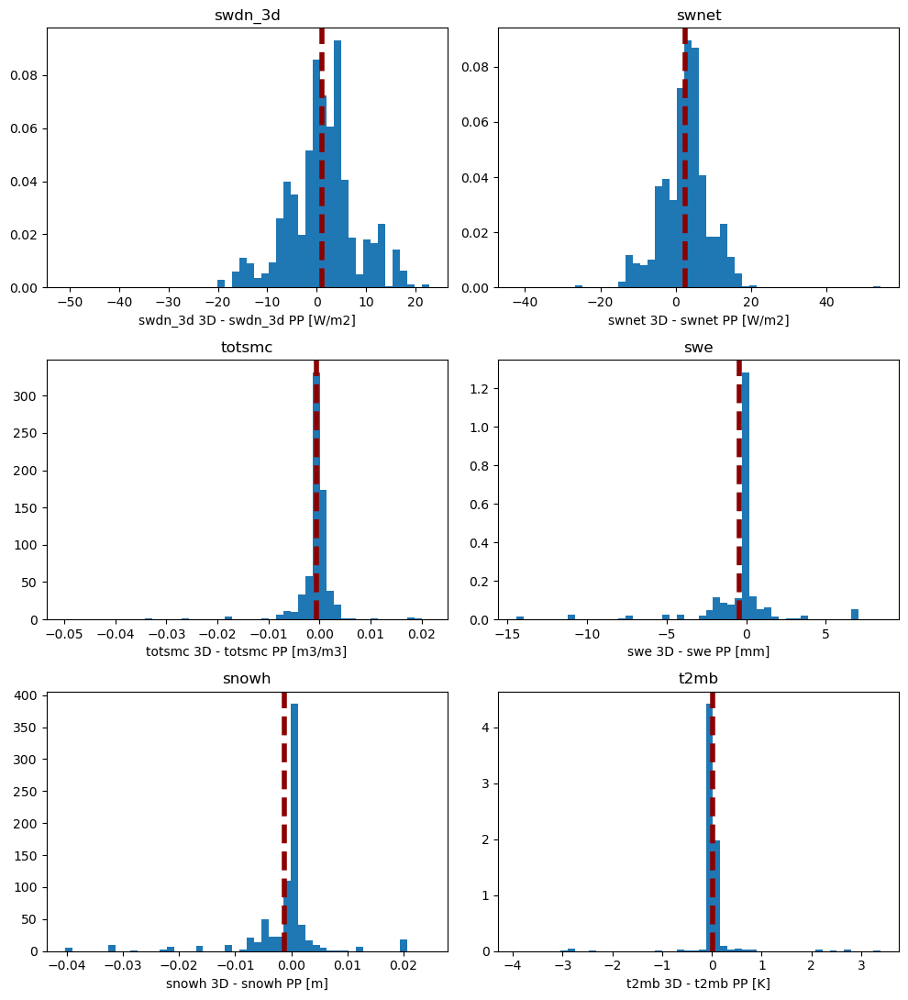

Creating differences plot for Summer


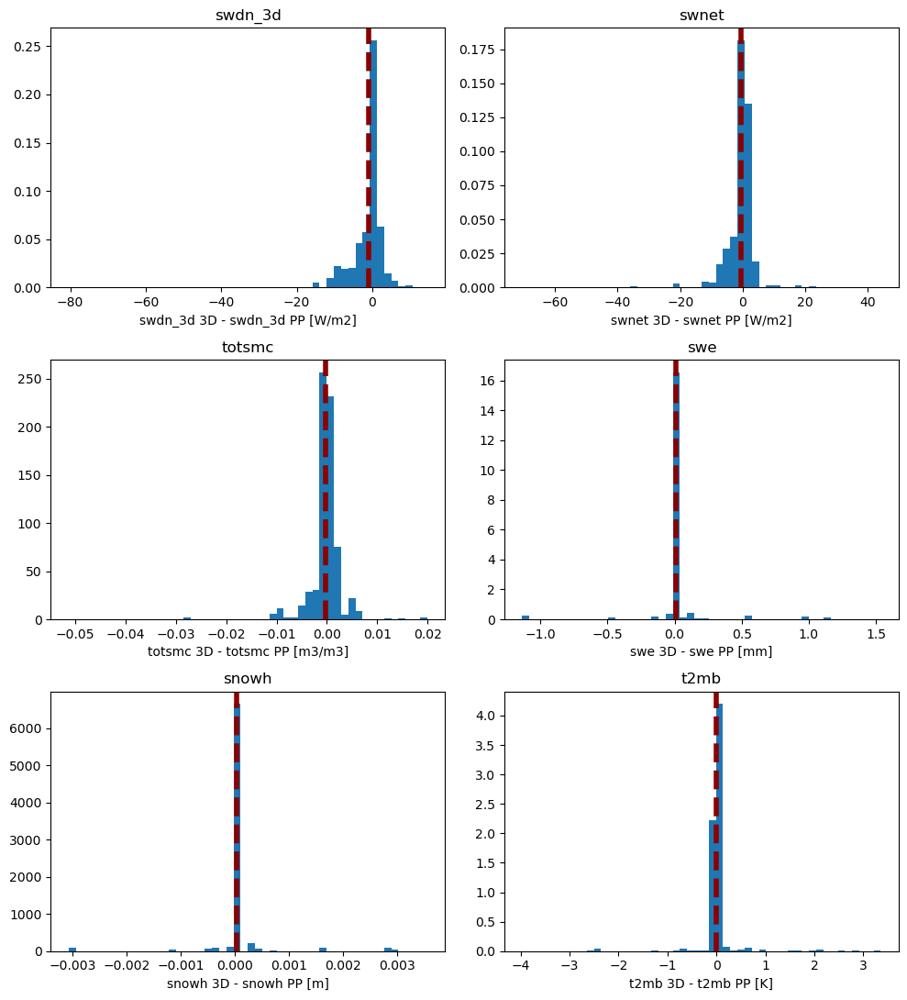

Creating differences plot for Fall


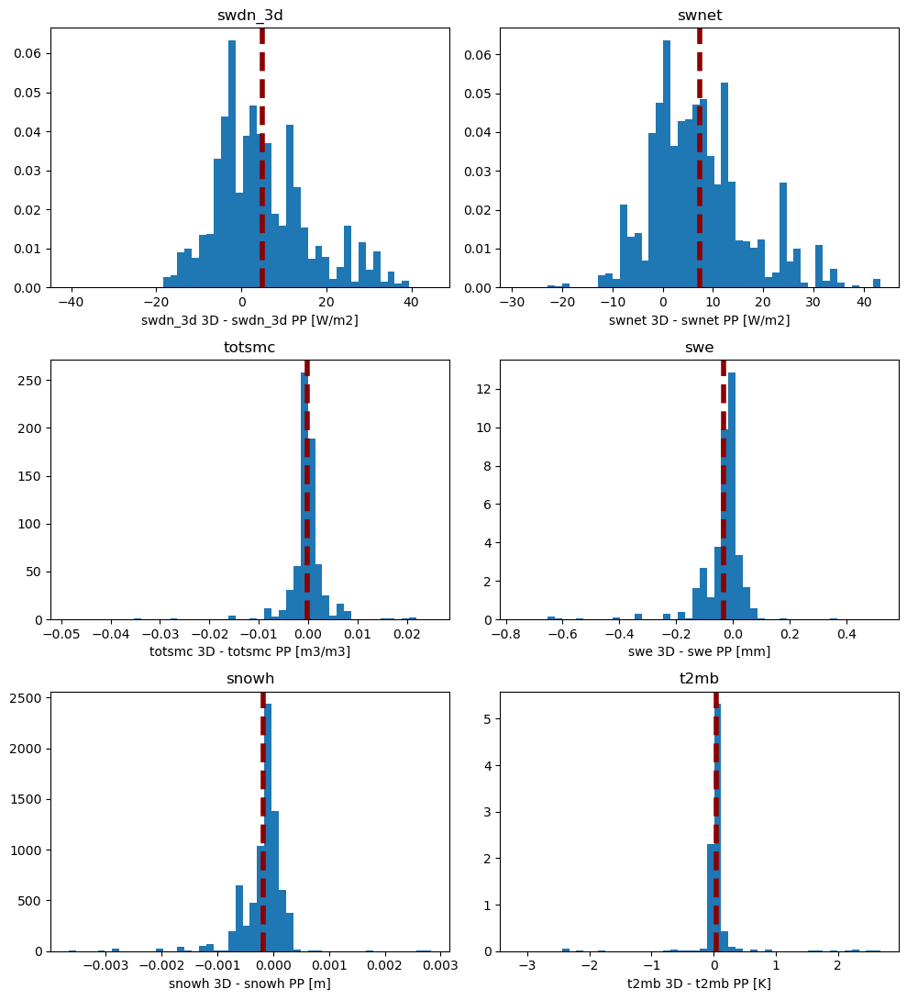

In [ ]:



# plot the differeneces of these variables between the two simulations
var2plot = ["swdn_3d", "swnet", "totsmc", "swe", "snowh", "t2mb"]
unit2plot= ['W/m2', 'W/m2', 'm3/m3', 'mm', 'm', 'K']

seasons = ['Winter', 'Spring', 'Summer', 'Fall']
season_months = [(12,1,2), (3, 4, 5), (6, 7, 8), (9, 10, 11)]
# hrus should be the same between the two model configurations
# hrus = gdal_tools.read_raster('/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus.vrt')

cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
tmp = np.copy(hrus)
tmp[:] = -9999.0

for iss, my_season in enumerate(seasons):
    my_months = season_months[iss]
    print("Creating differences plot for {}".format(my_season))
    

    # Create a 4x2 grid of subplots
    fig, axes = plt.subplots(3, 2, figsize=(10, 11))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

    # Loop over the variables in var2plot and plot each in a subplot
    for j, ax in enumerate(axes):
        var = var2plot[j]
        if j >= len(var2plot):
            # If there are more subplots than variables, hide the extra axes
            ax.axis('off')
            continue


        for c in range(1, 2):
            fp_3d = nc.Dataset(path_3d + '/output_data/{}/2016-01-01.nc'.format(c))
            grp_3d = fp_3d.groups['data']
            data_3d = np.array(grp_3d.variables[var2plot[j]][:])

            fp_pp = nc.Dataset(path_pp + '/output_data/{}/2016-01-01.nc'.format(c))
            grp_pp = fp_pp.groups['data']
            if var2plot[j] in ['swdn_3d', 'lwdn_3d']:
                var2plot_temp = var2plot[j].split('_')[0]
                data_pp = np.array(grp_pp.variables[var2plot_temp][:])
            else:
                data_pp = np.array(grp_pp.variables[var2plot[j]][:])
        

            # compute difference between 3D and PP simulations
            data_diff = data_3d - data_pp
        
        
            # subset or average data in time
            times_index = ((times.dt.month == my_months[0])|(times.dt.month == my_months[1])|(times.dt.month == my_months[2])) # select season from entire dataset

            data_diff_sel = data_diff[times_index,:]
            data_diff_ave = np.mean(data_diff_sel, axis=0)

            final_map = place_data(tmp, data_diff_ave, hrus, cids, int(c))
    
        # Mask out invalid values
        final_map = np.ma.masked_array(final_map, final_map == -9999)
        final_map[final_map==-9999] = np.nan
        final_map = final_map[buffer:map_shape[0]-buffer+1, buffer:map_shape[1]-buffer+1]
        final_array = np.ravel(final_map)
        final_array = final_array[np.logical_not(np.isnan(final_array))]
        
        # Plot in the corresponding subplot
        im = ax.hist(final_array, bins = 50, density=True)
        im2 = ax.axvline(np.mean(final_array), linestyle='dashed', linewidth = '4', color = 'darkred')
        ax.set_title(var2plot[j])  # Set the title for each subplot        
        ax.set_xlabel('{} 3D - {} PP [{}]'.format(var2plot[j], var2plot[j],unit2plot[j]))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.savefig(os.path.join(outputdir, 'res_diff_histogram_{}.png'.format(my_season)), dpi = 300)
    plt.show()

Plotting results for: month = 12, hour = 8 local time


/projects/battobrah@xsede.org/code-server/tmp/ipykernel_3193967/4228110222.py:85: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='bwr', norm=diff_norm)


Plotting results for: month = 7, hour = 8 local time
Plotting results for: month = 12, hour = 11 local time
Plotting results for: month = 7, hour = 11 local time
Plotting results for: month = 12, hour = 14 local time
Plotting results for: month = 7, hour = 14 local time
Plotting results for: month = 12, hour = 17 local time
Plotting results for: month = 7, hour = 17 local time


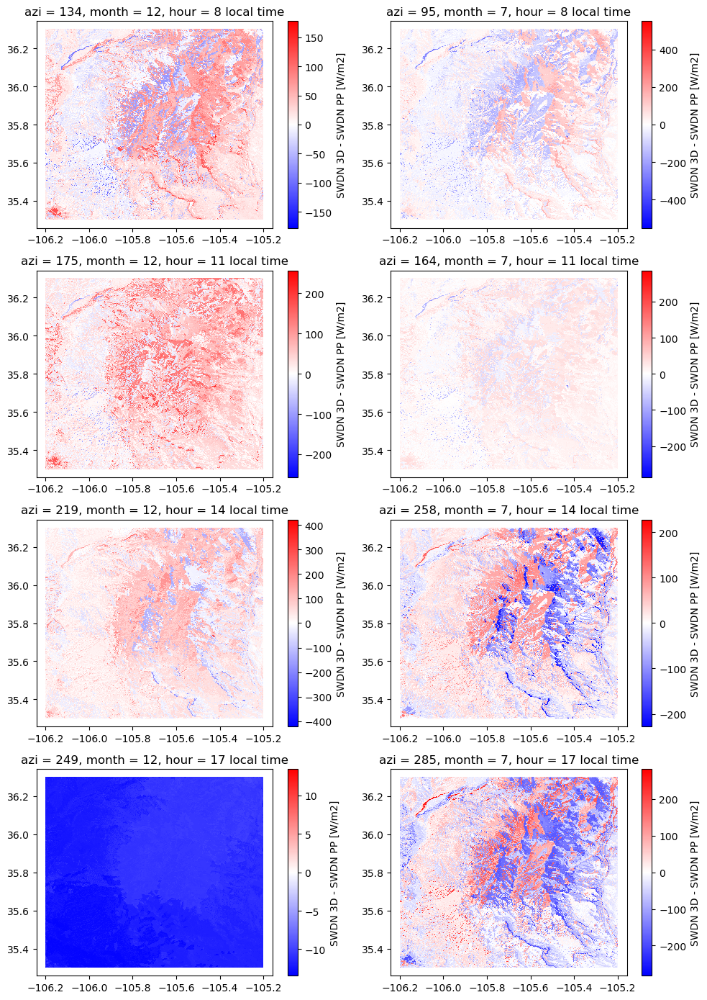

In [ ]:
# now plot a single variable for 
# MNT_2_PLOT = [1, 5, 1, 5, 1, 5, 1, 5] # Jan and June
MNT_2_PLOT = [12, 7, 12, 7, 12, 7, 12, 7] # Jan and June
HRS_2_PLOT = [8, 8, 11, 11, 14, 14, 17, 17] # Local time hours to plot






# plot the differeneces of these variables between the two simulations
var2plot = "swdn_3d"

var2print = "azimuth"



cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
tmp = np.copy(hrus)
tmp[:] = -9999.0

# Create a 4x2 grid of subplots
fig, axes = plt.subplots(4, 2, figsize=(10, 14))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Loop over the variables in var2plot and plot each in a subplot
for j, ax in enumerate(axes):
    month = MNT_2_PLOT[j]
    hour = HRS_2_PLOT[j]
    times_index = ( (times.dt.hour == hour) | (times.dt.hour == hour+1)) & (times.dt.month == month)
    print("Plotting results for: month = {}, hour = {} local time".format(month,hour)) 
    if j >= len(MNT_2_PLOT):
        # If there are more subplots than variables, hide the extra axes
        ax.axis('off')
        continue


    for c in range(1, 2):
        fp_3d = nc.Dataset(path_3d + '/output_data/{}/2016-01-01.nc'.format(c))
        grp_3d = fp_3d.groups['data']
        data_3d = np.array(grp_3d.variables[var2plot][:])

        azim = np.array(grp_3d.variables[var2print][:])

        fp_pp = nc.Dataset(path_pp + '/output_data/{}/2016-01-01.nc'.format(c))
        grp_pp = fp_pp.groups['data']
        if var2plot in ['swdn_3d', 'lwdn_3d']:
            var2plot_temp = var2plot.split('_')[0]
            data_pp = np.array(grp_pp.variables[var2plot_temp][:])
        else:
            data_pp = np.array(grp_pp.variables[var2plot][:])
        

        # compute difference between 3D and PP simulations
        data_diff = data_3d - data_pp
        
        
        # subset or average data in time
        data_diff_sel = data_diff[times_index,:]
        data_diff_ave = np.mean(data_diff_sel, axis=0)

        final_map = place_data(tmp, data_diff_ave, hrus, cids, int(c))

        azim = azim[times_index,:]
        azim = np.mean(azim)*180/np.pi
    
    # Mask out invalid values
    final_map = np.ma.masked_array(final_map, final_map == -9999)
    final_map[final_map==-9999] = np.nan
    
    final_map = final_map[buffer:map_shape[0]-buffer+1, buffer:map_shape[1]-buffer+1]
    # Plot in the corresponding subplot
    # hru_path = "/projects/ezorzetto@xsede.org/snow_experiment/experiments/simulations/MSWX_3h_Snow_Project_4_3d/postprocess/hrus/1.tif"
    # hru = rasterio.open(hru_path)
    # im = ax.imshow(final_map, cmap='terrain')

    mymin = np.abs(np.nanmin(final_map))
    mymax = np.abs(np.nanmax(final_map))
    diff_norm = colors.TwoSlopeNorm(
        vmin=-max(mymin, mymax),
        vcenter=0.0,
        vmax= max(mymin, mymax)
        )
    # im = ax.imshow(final_map, cmap='bwr', norm=diff_norm)
    im = ax.pcolormesh(coords_x, coords_y, np.flipud(final_map), cmap='bwr', norm=diff_norm)
    ax.set_title("azi = {:.0f}, month = {}, hour = {} local time".format(azim,month,hour))  # Set the title for each subplot
    fig.colorbar(im, ax=ax, label = 'SWDN 3D - SWDN PP [W/m2]')

# Adjust layout to avoid overlap
plt.tight_layout()
plt.savefig(os.path.join(outputdir, 'res_swdn3d_hours2.png'), dpi = 300)
plt.show()

In [ ]:
'''
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

import plotly.io as pio
pio.renderers.default = "browser"

MNT_2_PLOT = [12, 7, 12, 7, 12, 7, 12, 7] # Jan and June
HRS_2_PLOT = [8, 8, 11, 11, 14, 14, 17, 17] # Local time hours to plot

titles = [
    f"month = {m}, hour = {h} LT"
    for m, h in zip(MNT_2_PLOT, HRS_2_PLOT)
]

global_vmax = 0

# plot the differeneces of these variables between the two simulations
var2plot = "swdn_3d"

fig = make_subplots(
    rows=4,
    cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]] * 4,
    subplot_titles=titles,
)



k = 0  # subplot counter

for row in range(1, 5):
    for col in range(1, 3):

        month = MNT_2_PLOT[k]
        hour = HRS_2_PLOT[k]

        times_index = (
            ((times.dt.hour == hour) | (times.dt.hour == hour + 1)) &
            (times.dt.month == month)
        )

        for c in range(1, 2):
            fp_3d = nc.Dataset(f"{path_3d}/output_data/{c}/2014-01-01.nc")
            grp_3d = fp_3d.groups['data']
            data_3d = np.array(grp_3d.variables[var2plot][:])

            fp_pp = nc.Dataset(f"{path_pp}/output_data/{c}/2014-01-01.nc")
            grp_pp = fp_pp.groups['data']
            var2plot_temp = var2plot.split('_')[0]
            data_pp = np.array(grp_pp.variables[var2plot_temp][:])

            cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
            tmp = np.copy(hrus)
            tmp[:] = -9999.0

            data_diff = data_3d - data_pp
            data_diff_sel = data_diff[times_index, :]
            data_diff_ave = np.mean(data_diff_sel, axis=0)
            final_map1 = place_data(tmp, data_diff_ave, hrus, cids, int(c))

            cids = gdal_tools.read_raster(path + 'postprocess/cids.vrt')
            tmp = np.copy(hrus)
            tmp[:] = -9999.0

            # get DEM
            fdem = nc.Dataset(path + '%s/input_file.nc' % c)
            grpdem = fdem.groups['parameters']
            data_dem = np.array(grpdem.variables['dem'][:])
            elev_map = place_data(tmp, data_dem, hrus, cids, int(c))

            

        final_map1 = np.where(final_map1 == -9999, np.nan, final_map1)
        elev_map = np.where(elev_map == -9999, np.nan, elev_map)

        
        final_map2 = final_map1[
            buffer:map_shape[0]-buffer+1,
            buffer:map_shape[1]-buffer+1
        ]

        # Z = np.copy(dem_map)
        # Z[Z<0] = np.nan
        Z = elev_map[  # DEM geometry
             buffer:map_shape[0]-buffer+1,
             buffer:map_shape[1]-buffer+1
        ]

        # vmax = np.nanmax(np.abs(final_map))
        global_vmax = max(global_vmax, np.nanmax(np.abs(final_map2)))
        # print("global vmax = {}".format(global_vmax))

        # dome some smoothing
        stride = 2
        Z = Z[::stride, ::stride]
        final_map2 = final_map2[::stride, ::stride]

        x_coords = np.arange(Z.shape[0])
        y_coords = np.arange(Z.shape[1])

        fig.add_trace(
            go.Surface(
                x=x_coords,
                y=y_coords,
                z=Z,
                surfacecolor=final_map2,
                colorscale='RdBu',
                cmin=-global_vmax,
                cmax=global_vmax,
                showscale=(k == 0),  # one shared colorbar
                colorbar=dict(
                    title='SWDN 3D − SWDN PP [W/m²]',
                    len=0.75
                )
            ),
            row=row,
            col=col
        )

        k += 1

fig.update_layout(
    height=1400,
    width=1100,
)

# Sync all cameras
camera = dict(eye=dict(x=1.6, y=1.6, z=0.6))
for s in fig.layout:
    if s.startswith("scene"):
        fig.layout[s].camera = camera


fig.show()  # fully interactive in VS Code Jupyter


# zip output 
os.system("tar -cvf output_plots.tar output_plots/")

'''

'\nimport plotly.graph_objects as go\nfrom plotly.subplots import make_subplots\nimport numpy as np\n\nimport plotly.io as pio\npio.renderers.default = "browser"\n\nMNT_2_PLOT = [12, 7, 12, 7, 12, 7, 12, 7] # Jan and June\nHRS_2_PLOT = [8, 8, 11, 11, 14, 14, 17, 17] # Local time hours to plot\n\ntitles = [\n    f"month = {m}, hour = {h} LT"\n    for m, h in zip(MNT_2_PLOT, HRS_2_PLOT)\n]\n\nglobal_vmax = 0\n\n# plot the differeneces of these variables between the two simulations\nvar2plot = "swdn_3d"\n\nfig = make_subplots(\n    rows=4,\n    cols=2,\n    specs=[[{\'type\': \'surface\'}, {\'type\': \'surface\'}]] * 4,\n    subplot_titles=titles,\n)\n\n\n\nk = 0  # subplot counter\n\nfor row in range(1, 5):\n    for col in range(1, 3):\n\n        month = MNT_2_PLOT[k]\n        hour = HRS_2_PLOT[k]\n\n        times_index = (\n            ((times.dt.hour == hour) | (times.dt.hour == hour + 1)) &\n            (times.dt.month == month)\n        )\n\n        for c in range(1, 2):\n           

In [ ]:
import rasterio

model_grid = path + "postprocess/hrus/1.tif"   # or dem/1.tif, cids.vrt


with rasterio.open(model_grid) as src:
    print("Model CRS:", src.crs)
    print("Model transform:\n", src.transform)
    print("Pixel size:", src.res)


Model CRS: EPSG:4326
Model transform:
 | 0.00, 0.00,-106.45|
| 0.00,-0.00, 36.55|
| 0.00, 0.00, 1.00|
Pixel size: (0.0008333333333333, 0.0008333333333333)


In [ ]:
import netCDF4 as nc

fp = nc.Dataset(path_3d + "/output_data/1/2016-01-01.nc")
print(list(fp.groups["data"].variables.keys()))
fp.close()


['qsnow', 'totsmc', 'swe', 'snow_t', 'snowh', 'fsno', 't2mv', 't2mb', 'swdn', 'swdn_3d', 'swnet', 'cosz', 'azimuth', 'smc']


In [ ]:
import netCDF4 as nc

# pick ONE representative model output
ncfile = (
    "/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/"
    "experiments/simulations/MSWX_3h_Snow_Project3_3d/"
    "output_data/1/2016-01-01.nc"
)

ds = nc.Dataset(ncfile)

print("Groups:", list(ds.groups.keys()))
print()

grp = ds.groups["data"]

print("Variables:")
for v in grp.variables:
    print(
        f"{v:10s}",
        "shape =", grp.variables[v].shape,
        "dims =", grp.variables[v].dimensions
    )

ds.close()


Groups: ['data', 'metadata']

Variables:
qsnow      shape = (8744, 1000) dims = ('time', 'hru')
totsmc     shape = (8744, 1000) dims = ('time', 'hru')
swe        shape = (8744, 1000) dims = ('time', 'hru')
snow_t     shape = (8744, 1000, 3) dims = ('time', 'hru', 'snow')
snowh      shape = (8744, 1000) dims = ('time', 'hru')
fsno       shape = (8744, 1000) dims = ('time', 'hru')
t2mv       shape = (8744, 1000) dims = ('time', 'hru')
t2mb       shape = (8744, 1000) dims = ('time', 'hru')
swdn       shape = (8744, 1000) dims = ('time', 'hru')
swdn_3d    shape = (8744, 1000) dims = ('time', 'hru')
swnet      shape = (8744, 1000) dims = ('time', 'hru')
lwdn       shape = (8744, 1000) dims = ('time', 'hru')
lwdn_3d    shape = (8744, 1000) dims = ('time', 'hru')
lwnet      shape = (8744, 1000) dims = ('time', 'hru')
cosz       shape = (8744, 1000) dims = ('time', 'hru')
azimuth    shape = (8744, 1000) dims = ('time', 'hru')
smc        shape = (8744, 1000, 10) dims = ('time', 'hru', 'soil')


In [ ]:
import netCDF4 as nc

# pick ONE representative model output
ncfile = (
    "/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/"
    "experiments/simulations/MSWX_3h_Snow_Project3_3d/"
    "output_data/1/2016-01-01.nc"
)

ds = nc.Dataset(ncfile)

print("Top-level groups:")
print(list(ds.groups.keys()))
print()

# loop over ALL groups
for gname, grp in ds.groups.items():
    print(f"=== Group: {gname} ===")

    if len(grp.variables) == 0:
        print("  (no variables)")
    else:
        for vname, var in grp.variables.items():
            print(
                f"  {vname:12s}",
                "shape =", var.shape,
                "dims =", var.dimensions
            )
    print()

ds.close()


Top-level groups:
['data', 'metadata']

=== Group: data ===
  qsnow        shape = (8744, 1000) dims = ('time', 'hru')
  totsmc       shape = (8744, 1000) dims = ('time', 'hru')
  swe          shape = (8744, 1000) dims = ('time', 'hru')
  snow_t       shape = (8744, 1000, 3) dims = ('time', 'hru', 'snow')
  snowh        shape = (8744, 1000) dims = ('time', 'hru')
  fsno         shape = (8744, 1000) dims = ('time', 'hru')
  t2mv         shape = (8744, 1000) dims = ('time', 'hru')
  t2mb         shape = (8744, 1000) dims = ('time', 'hru')
  swdn         shape = (8744, 1000) dims = ('time', 'hru')
  swdn_3d      shape = (8744, 1000) dims = ('time', 'hru')
  swnet        shape = (8744, 1000) dims = ('time', 'hru')
  lwdn         shape = (8744, 1000) dims = ('time', 'hru')
  lwdn_3d      shape = (8744, 1000) dims = ('time', 'hru')
  lwnet        shape = (8744, 1000) dims = ('time', 'hru')
  cosz         shape = (8744, 1000) dims = ('time', 'hru')
  azimuth      shape = (8744, 1000) dims = (

In [10]:
import netCDF4 as nc
import numpy as np

# pick ONE representative model output
ncfile = (
    "/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/"
    "experiments/simulations/MSWX_3h_Snow_Project3_3d/"
    "output_data/1/2016-01-01.nc"
)

ds = nc.Dataset(ncfile)

print("="*60)
print("GLOBAL ATTRIBUTES")
print("="*60)
for attr in ds.ncattrs():
    print(f"{attr}: {getattr(ds, attr)}")

print("\n" + "="*60)
print("GROUPS")
print("="*60)
print(list(ds.groups.keys()))

grp = ds.groups["data"]

print("\n" + "="*60)
print("VARIABLES")
print("="*60)
for v in grp.variables:
    var = grp.variables[v]
    print(f"{v:12s} shape={var.shape} dims={var.dimensions}")

print("\n" + "="*60)
print("COORDINATE VARIABLES")
print("="*60)

# Check for typical coordinate names
for cname in ["lat", "latitude", "lon", "longitude", "x", "y"]:
    if cname in grp.variables:
        coord = grp.variables[cname][:]
        print(f"{cname}:")
        print("  shape:", coord.shape)
        print("  min/max:", np.nanmin(coord), np.nanmax(coord))
        if coord.ndim == 1 and len(coord) > 1:
            res = np.abs(coord[1] - coord[0])
            print("  approx resolution:", res)
        print()

print("\n" + "="*60)
print("CRS INFORMATION")
print("="*60)

# Check for CRS variable
for v in grp.variables:
    var = grp.variables[v]
    if hasattr(var, "grid_mapping_name"):
        print(f"{v} has grid mapping:")
        for attr in var.ncattrs():
            print(f"  {attr}: {getattr(var, attr)}")

ds.close()

GLOBAL ATTRIBUTES

GROUPS
['data', 'metadata']

VARIABLES
qsnow        shape=(8744, 1000) dims=('time', 'hru')
totsmc       shape=(8744, 1000) dims=('time', 'hru')
swe          shape=(8744, 1000) dims=('time', 'hru')
snow_t       shape=(8744, 1000, 3) dims=('time', 'hru', 'snow')
snowh        shape=(8744, 1000) dims=('time', 'hru')
fsno         shape=(8744, 1000) dims=('time', 'hru')
t2mv         shape=(8744, 1000) dims=('time', 'hru')
t2mb         shape=(8744, 1000) dims=('time', 'hru')
swdn         shape=(8744, 1000) dims=('time', 'hru')
swdn_3d      shape=(8744, 1000) dims=('time', 'hru')
swnet        shape=(8744, 1000) dims=('time', 'hru')
lwdn         shape=(8744, 1000) dims=('time', 'hru')
lwdn_3d      shape=(8744, 1000) dims=('time', 'hru')
lwnet        shape=(8744, 1000) dims=('time', 'hru')
cosz         shape=(8744, 1000) dims=('time', 'hru')
azimuth      shape=(8744, 1000) dims=('time', 'hru')
smc          shape=(8744, 1000, 10) dims=('time', 'hru', 'soil')

COORDINATE VARIAB

In [12]:
import rasterio

hrus_fp = "/scratch/alpine/battobrah@xsede.org/HydroBlocks_Enrico_dev/experiments/simulations/MSWX_3h_Snow_Project3_3d/postprocess/hrus.vrt"

with rasterio.open(hrus_fp) as src:
    print("=== CRS / GRID FROM hrus.vrt ===")
    print("CRS:", src.crs)                 # e.g., EPSG:4326
    print("Transform:", src.transform)     # affine geotransform
    print("Resolution (x,y):", src.res)    # pixel size (units of CRS)
    print("Width x Height:", src.width, "x", src.height)
    print("Bounds:", src.bounds)           # left, bottom, right, top

    # coordinate vectors (cell centers)
    xs = src.transform * (np.arange(src.width) + 0.5, np.zeros(src.width) + 0.5)
    # the line above returns arrays weirdly; simplest is:
    x_centers = src.transform.c + (np.arange(src.width) + 0.5) * src.transform.a
    y_centers = src.transform.f + (np.arange(src.height) + 0.5) * src.transform.e  # e is negative for north-up

print("x range:", x_centers.min(), x_centers.max())
print("y range:", y_centers.min(), y_centers.max())

=== CRS / GRID FROM hrus.vrt ===
CRS: EPSG:4326
Transform: | 0.00, 0.00,-106.45|
| 0.00,-0.00, 36.55|
| 0.00, 0.00, 1.00|
Resolution (x,y): (0.0008333333333333, 0.0008333333333333)
Width x Height: 1801 x 1801
Bounds: BoundingBox(left=-106.45041666666549, bottom=35.049583333332606, right=-104.94958333333221, top=36.55041666666588)
x range: -106.44999999999882 -104.94999999999888
y range: 35.04999999999927 36.549999999999216
